# Visualising Australian Rain Dataset

In [1]:
import numpy as np
import pandas as pd
import seaborn as sea
import statistics as stat
import matplotlib.pyplot as plt

# Viewing Dataset 

In [2]:
data = pd.read_csv("weatherAUS.csv")
data.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


# Shape

In [3]:
data.shape

(142193, 24)

In [4]:
data.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          679
Evaporation       356
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           440
Temp3pm           500
RainToday           2
RISK_MM           681
RainTomorrow        2
dtype: int64

In [5]:
data.isna().sum()

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RISK_MM              0
RainTomorrow         0
dtype: int64

# Treating the Null values

In [6]:
data['MinTemp']=data['MinTemp'].fillna(data['MinTemp'].mean())
data['MaxTemp']=data['MinTemp'].fillna(data['MaxTemp'].mean())
data['Rainfall']=data['Rainfall'].fillna(data['Rainfall'].mean())
data['Evaporation']=data['Evaporation'].fillna(data['Evaporation'].mean())
data['Sunshine']=data['Sunshine'].fillna(data['Sunshine'].mean())
data['WindGustSpeed']=data['WindGustSpeed'].fillna(data['WindGustSpeed'].mean())
data['WindSpeed9am']=data['WindSpeed9am'].fillna(data['WindSpeed9am'].mean())
data['WindSpeed3pm']=data['WindSpeed3pm'].fillna(data['WindSpeed3pm'].mean())
data['Humidity9am']=data['Humidity9am'].fillna(data['Humidity9am'].mean())
data['Humidity3pm']=data['Humidity3pm'].fillna(data['Humidity3pm'].mean())
data['Pressure9am']=data['Pressure9am'].fillna(data['Pressure9am'].mean())
data['Pressure3pm']=data['Pressure3pm'].fillna(data['Pressure3pm'].mean())
data['Cloud9am']=data['Cloud9am'].fillna(data['Cloud9am'].mean())
data['Cloud3pm']=data['Cloud3pm'].fillna(data['Cloud3pm'].mean())
data['Temp9am']=data['Temp9am'].fillna(data['Temp9am'].mean())
data['Temp3pm']=data['Temp3pm'].fillna(data['Temp3pm'].mean())

In [7]:
data['RainToday']=data['RainToday'].fillna(data['RainToday'].mode()[0])
data['RainTomorrow']=data['RainTomorrow'].fillna(data['RainTomorrow'].mode()[0])

In [8]:
data['WindDir9am'] = data['WindDir9am'].fillna(data['WindDir9am'].mode()[0])
data['WindGustDir'] = data['WindGustDir'].fillna(data['WindGustDir'].mode()[0])
data['WindDir3pm'] = data['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0])

In [9]:
data.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
dtype: int64

In [10]:
data.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,13.4,0.6,5.469824,7.624853,W,44.0,W,...,22.0,1007.7,1007.1,8.000000,4.503167,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,7.4,0.0,5.469824,7.624853,WNW,44.0,NNW,...,25.0,1010.6,1007.8,4.437189,4.503167,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,12.9,0.0,5.469824,7.624853,WSW,46.0,W,...,30.0,1007.6,1008.7,4.437189,2.000000,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,9.2,0.0,5.469824,7.624853,NE,24.0,SE,...,16.0,1017.6,1012.8,4.437189,4.503167,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,17.5,1.0,5.469824,7.624853,W,41.0,ENE,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0.2,No


# Mean

In [11]:
Location_chart = data.groupby(["Location"]).describe()
Location_chart.head(10)

MinTemp                                                        \
                count       mean       std  min     25%   50%     75%   max   
Location                                                                      
Adelaide       3090.0  12.628082  4.983002  0.7   9.100  12.1  15.575  33.9   
Albany         3016.0  12.933554  3.518065  1.8  10.300  12.8  15.800  21.5   
Albury         3011.0   9.526210  6.057150 -2.8   4.700   9.1  14.300  28.3   
AliceSprings   3031.0  13.124872  7.747865 -5.2   6.700  13.7  19.700  30.3   
BadgerysCreek  2928.0  11.141201  5.615738 -3.0   6.600  11.4  15.900  25.1   
Ballarat       3028.0   7.356898  4.716632 -5.6   4.200   7.0  10.325  25.1   
Bendigo        3034.0   8.592250  5.698872 -4.0   4.300   8.2  12.500  29.0   
Brisbane       3161.0  16.402980  4.609875  2.6  12.800  16.8  20.300  28.0   
Cairns         2988.0  21.196180  3.196372  9.2  19.375  21.8  23.700  28.4   
Canberra       3418.0   6.835527  6.248640 -8.0   1.800   7.0  11.900  24.4   

              MaxTemp             ...    Temp3pm       RISK_MM            \
                count       mean  ...        75%   max   count      mean   
Location                          ...                                      
Adelaide       3090.0  12.628082  ...  26.000000  44.3  3090.0  1.565243   
Albany         3016.0  12.933554  ...  21.687235  36.8  3016.0  2.263926   
Albury         3011.0   9.526210  ...  27.200000  43.4  3011.0  1.914381   
AliceSprings   3031.0  13.124872  ...  34.200000  43.2  3031.0  0.883141   
BadgerysCreek  2928.0  11.141201  ...  26.400000  43.7  2928.0  2.193101   
Ballarat       3028.0   7.356898  ...  21.600000  43.1  3028.0  1.739960   
Bendigo        3034.0   8.592250  ...  25.600000  44.4  3034.0  1.619380   
Brisbane       3161.0  16.402980  ...  27.600000  36.3  3161.0  3.144891   
Cairns         2988.0  21.196180  ...  29.800000  38.0  2988.0  5.741901   
Canberra       3418.0   6.835527  ...  24.500000  39.5  3418.0  1.741720   

                                                     
                     std  min  25%  50%  75%    max  
Location                                             
Adelaide        4.584992  0.0  0.0  0.0  0.8   75.2  
Albany          5.111578  0.0  0.0  0.0  1.8   49.4  
Albury          6.229975  0.0  0.0  0.0  0.4  104.2  
AliceSprings    4.465096  0.0  0.0  0.0  0.0   62.0  
BadgerysCreek   7.383433  0.0  0.0  0.0  0.4  116.0  
Ballarat        5.121357  0.0  0.0  0.0  1.2   95.0  
Bendigo         5.185085  0.0  0.0  0.0  0.4   66.4  
Brisbane       11.557880  0.0  0.0  0.0  0.6  182.6  
Cairns         18.281016  0.0  0.0  0.0  2.6  278.4  
Canberra        5.723482  0.0  0.0  0.0  0.2   87.0  

[10 rows x 136 columns]

# Cities in Australia

In [12]:
Location = data.Location.unique()
for loc in Location:
    print(loc)
print(len(Location))


Albury
BadgerysCreek
Cobar
CoffsHarbour
Moree
Newcastle
NorahHead
NorfolkIsland
Penrith
Richmond
Sydney
SydneyAirport
WaggaWagga
Williamtown
Wollongong
Canberra
Tuggeranong
MountGinini
Ballarat
Bendigo
Sale
MelbourneAirport
Melbourne
Mildura
Nhil
Portland
Watsonia
Dartmoor
Brisbane
Cairns
GoldCoast
Townsville
Adelaide
MountGambier
Nuriootpa
Woomera
Albany
Witchcliffe
PearceRAAF
PerthAirport
Perth
SalmonGums
Walpole
Hobart
Launceston
AliceSprings
Darwin
Katherine
Uluru
49


In [13]:
data[data.Location == Location[0]]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,13.4,0.6,5.469824,7.624853,W,44.0,W,...,22.0,1007.7,1007.1,8.000000,4.503167,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,7.4,0.0,5.469824,7.624853,WNW,44.0,NNW,...,25.0,1010.6,1007.8,4.437189,4.503167,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,12.9,0.0,5.469824,7.624853,WSW,46.0,W,...,30.0,1007.6,1008.7,4.437189,2.000000,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,9.2,0.0,5.469824,7.624853,NE,24.0,SE,...,16.0,1017.6,1012.8,4.437189,4.503167,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,17.5,1.0,5.469824,7.624853,W,41.0,ENE,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0.2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3006,2017-06-21,Albury,1.2,1.2,0.4,5.469824,7.624853,ENE,15.0,N,...,62.0,1029.4,1026.7,8.000000,4.503167,2.9,14.3,No,0.0,No
3007,2017-06-22,Albury,0.8,0.8,0.0,5.469824,7.624853,W,17.0,S,...,66.0,1029.4,1025.9,8.000000,1.000000,3.6,13.3,No,0.0,No
3008,2017-06-23,Albury,1.1,1.1,0.0,5.469824,7.624853,SE,44.0,SSE,...,81.0,1022.3,1017.7,8.000000,1.000000,2.7,10.2,No,0.2,No
3009,2017-06-24,Albury,1.1,1.1,0.2,5.469824,7.624853,WSW,28.0,SW,...,49.0,1018.8,1017.2,7.000000,6.000000,3.9,13.1,No,0.0,No


In [14]:
data["Date"]=pd.to_datetime(data["Date"])
data.Date.unique().shape
data.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RISK_MM                 float64
RainTomorrow             object
dtype: object

In [91]:
date = []
j=0
for i in range(2008, 2018) :
    start_date = str(i)+"-01-01"
    end_date = str(i)+"-12-31"
    after_start_date = data["Date"] >= start_date
    before_end_date = data["Date"] <= end_date
    between_two_dates = after_start_date & before_end_date
    date.append(data[between_two_dates])

# Number of Rainy Days in each city in every year

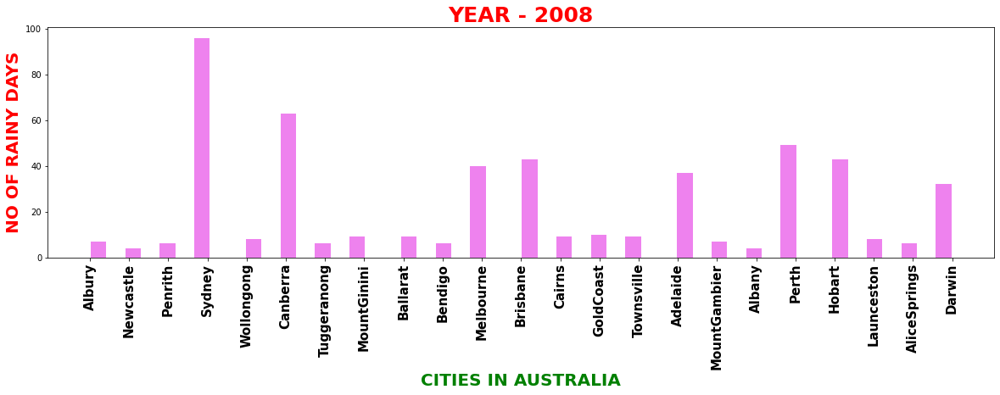

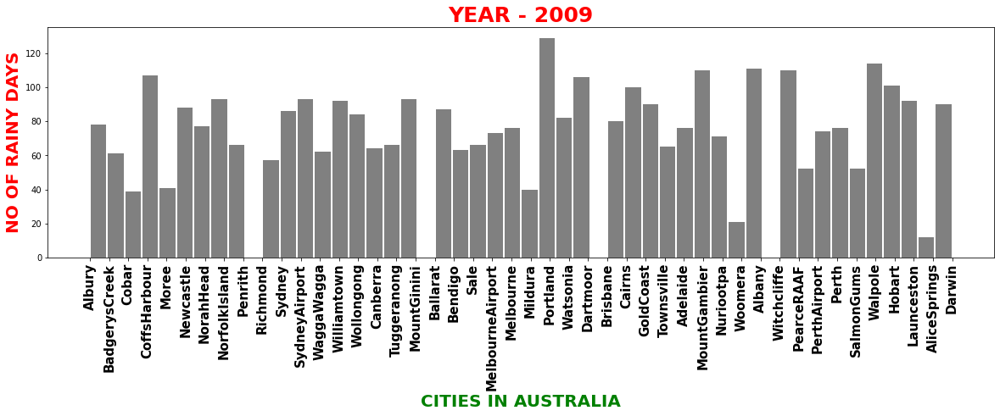

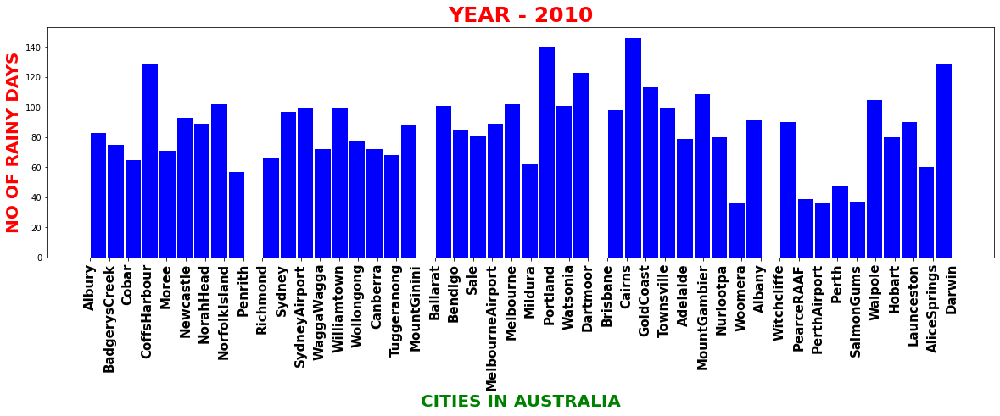

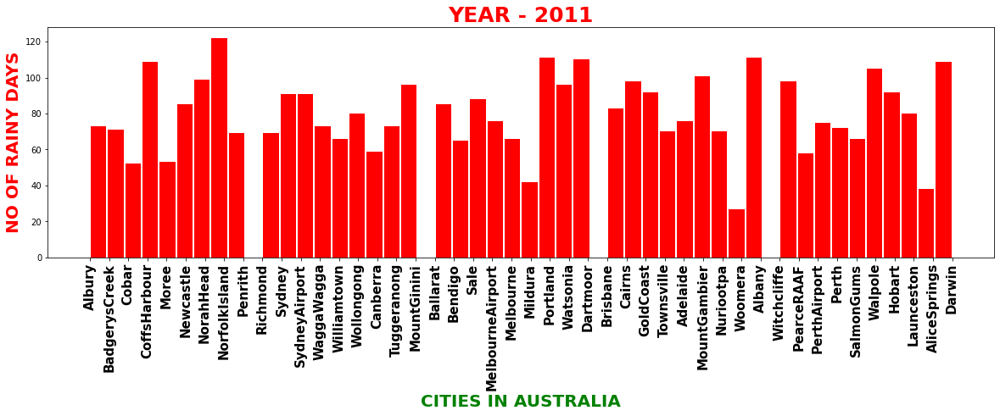

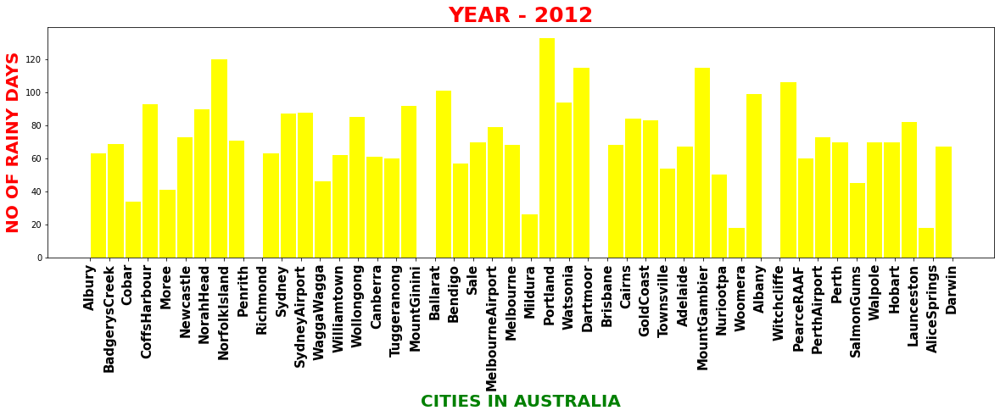

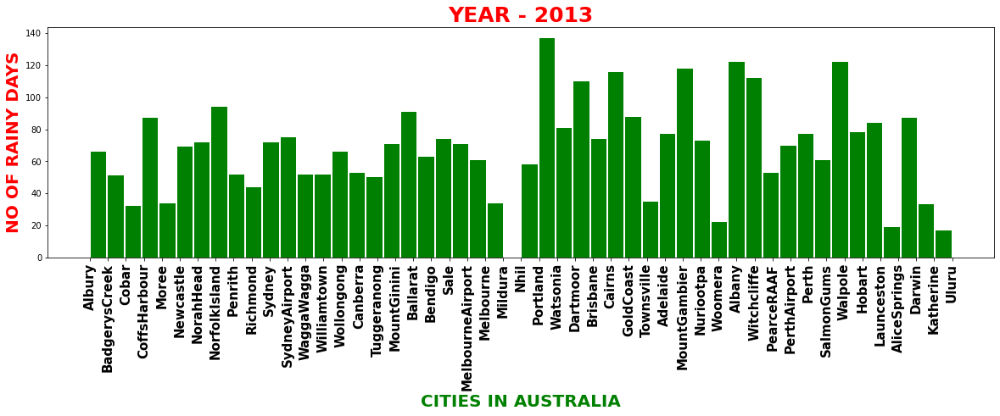

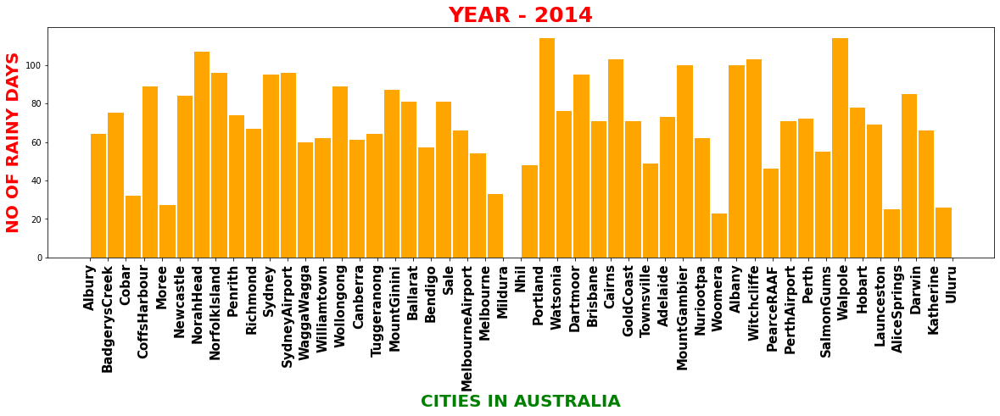

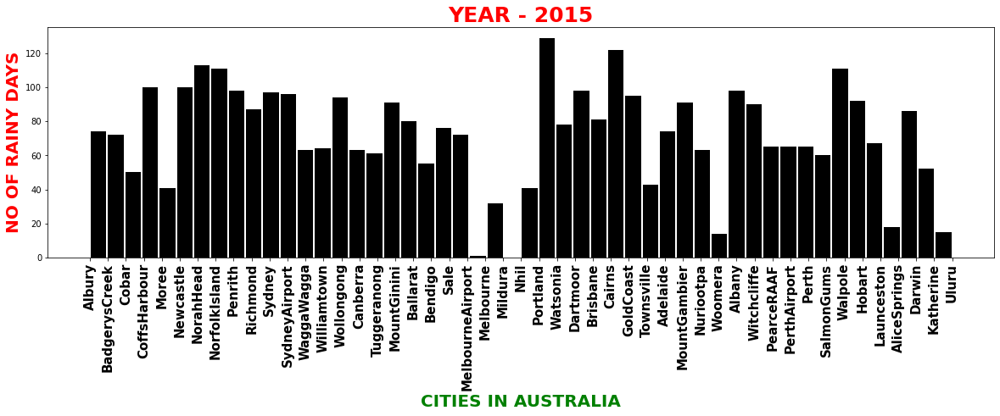

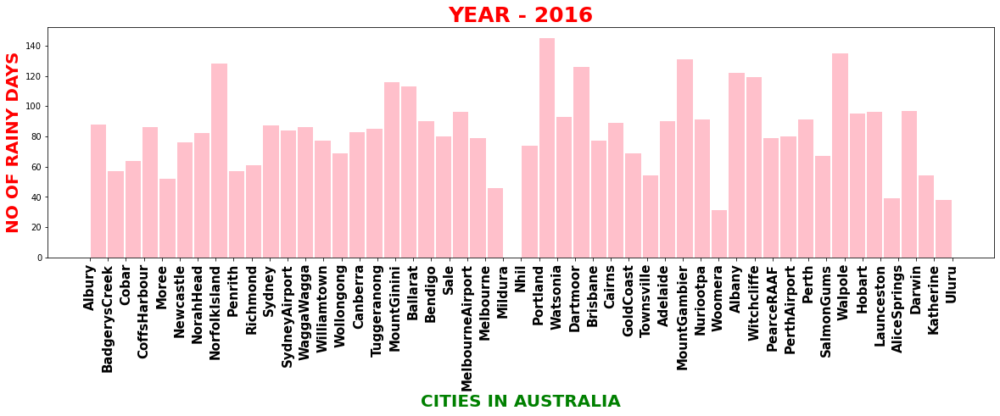

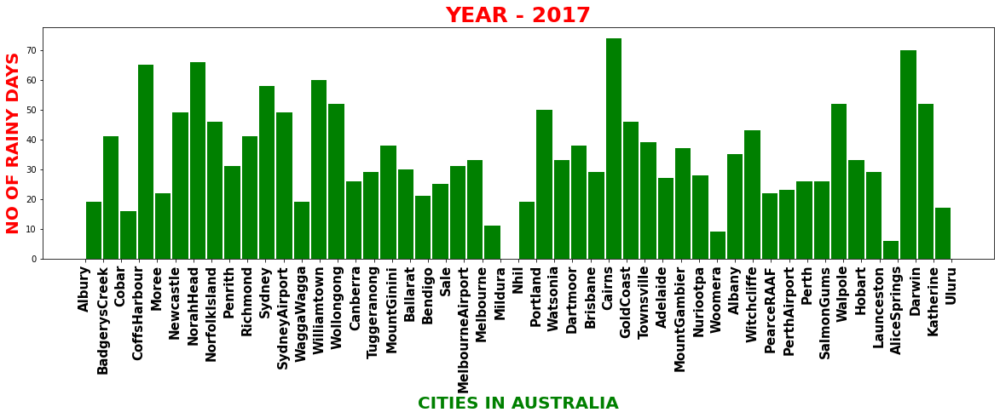

In [16]:
annual_year = []
color = ['violet', 'grey', 'blue', 'red', 'yellow', 'green', 'orange', 'black', 'pink', 'green']
for i in range(0, 10):
    annual_year.append(date[i].Location[date[i].RainToday == 'Yes'])
    plt.figure(figsize=(20, 5))
    plt.title("YEAR - "+str(i+2008),color='red', fontsize=25,fontweight="bold")
    plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
    plt.xlabel('CITIES IN AUSTRALIA', color='green',fontsize=20, fontweight="bold")
    plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
    plt.hist([annual_year[i]] ,bins=50, rwidth=0.9, color=color[i])


In [17]:
for city in Location:
    for year in range(10): 
        rain_in_city = date[year][date[year].Location == city]
        print(str(len(rain_in_city[rain_in_city.RainToday == 'Yes']))+" "+city)        


7 Albury
78 Albury
83 Albury
73 Albury
63 Albury
66 Albury
64 Albury
74 Albury
88 Albury
19 Albury
0 BadgerysCreek
61 BadgerysCreek
75 BadgerysCreek
71 BadgerysCreek
69 BadgerysCreek
51 BadgerysCreek
75 BadgerysCreek
72 BadgerysCreek
57 BadgerysCreek
41 BadgerysCreek
0 Cobar
39 Cobar
65 Cobar
52 Cobar
34 Cobar
32 Cobar
32 Cobar
50 Cobar
64 Cobar
16 Cobar
0 CoffsHarbour
107 CoffsHarbour
129 CoffsHarbour
109 CoffsHarbour
93 CoffsHarbour
87 CoffsHarbour
89 CoffsHarbour
100 CoffsHarbour
86 CoffsHarbour
65 CoffsHarbour
0 Moree
41 Moree
71 Moree
53 Moree
41 Moree
34 Moree
27 Moree
41 Moree
52 Moree
22 Moree
4 Newcastle
88 Newcastle
93 Newcastle
85 Newcastle
73 Newcastle
69 Newcastle
84 Newcastle
100 Newcastle
76 Newcastle
49 Newcastle
0 NorahHead
77 NorahHead
89 NorahHead
99 NorahHead
90 NorahHead
72 NorahHead
107 NorahHead
113 NorahHead
82 NorahHead
66 NorahHead
0 NorfolkIsland
93 NorfolkIsland
102 NorfolkIsland
122 NorfolkIsland
120 NorfolkIsland
94 NorfolkIsland
96 NorfolkIsland
111 Norfo

# Total Rainy days during the year 2008-2017 

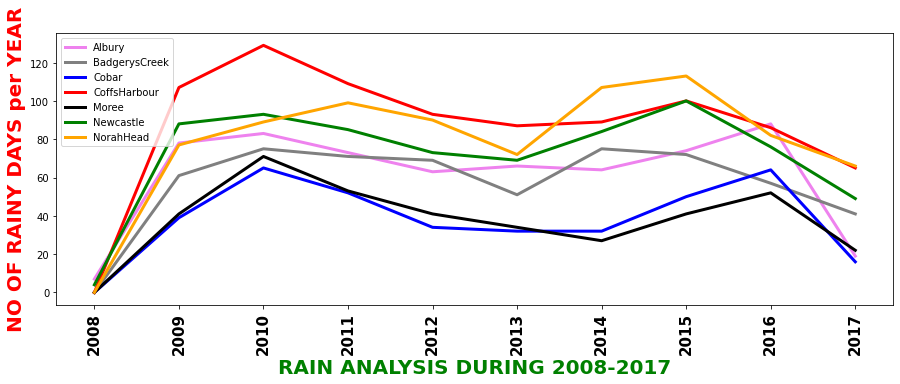

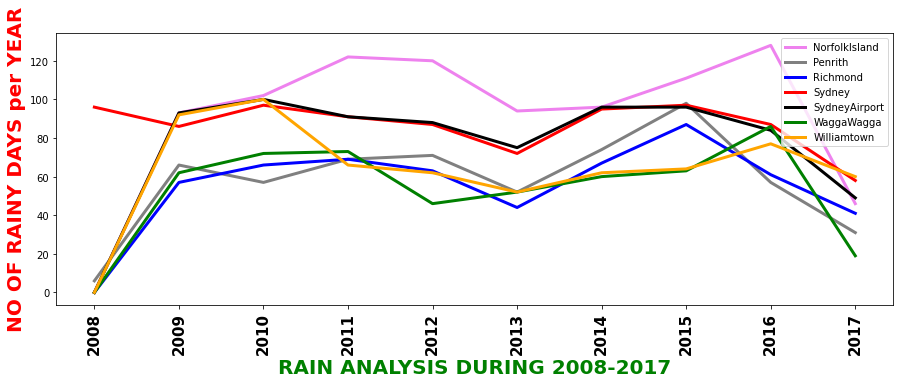

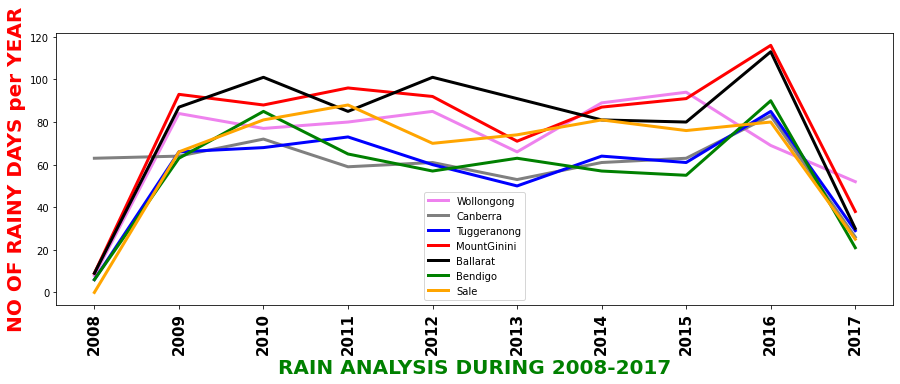

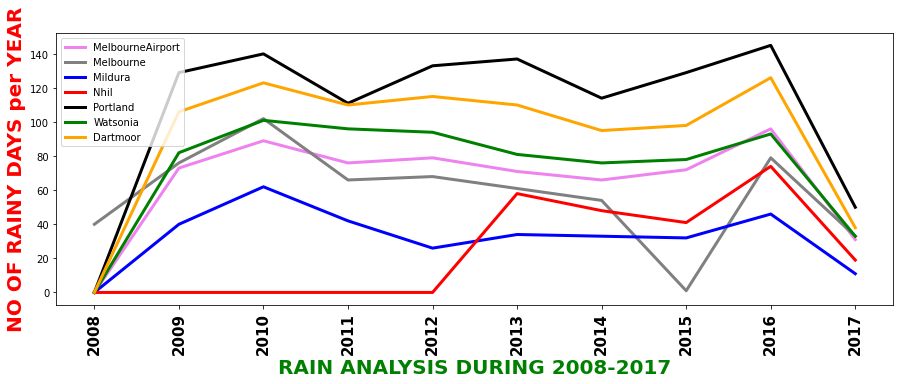

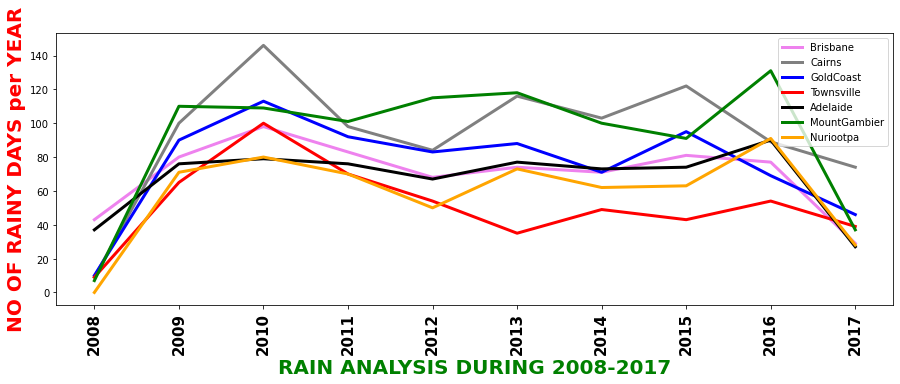

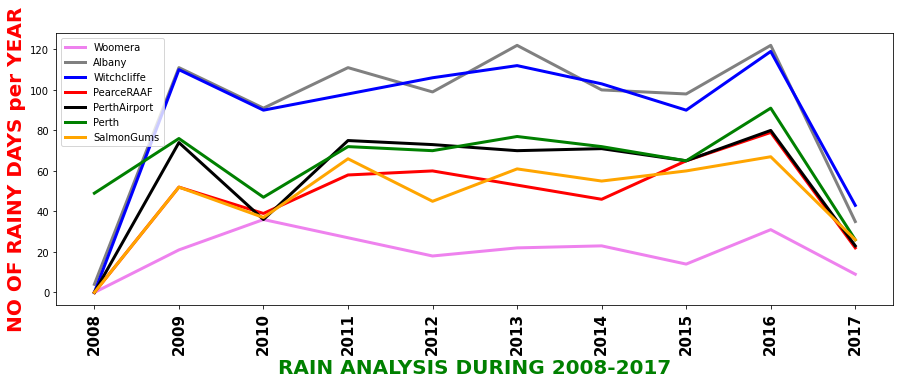

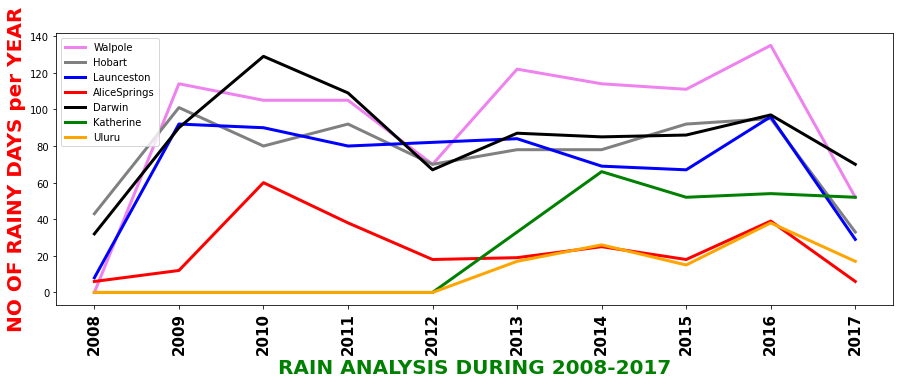

In [18]:
year = ['2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']
color = ['violet', 'grey', 'blue', 'red', 'black', 'green', 'orange']
start = 0
for i in range(7):
        plt.figure(figsize=(15, 5))
        j = 0
        start = i*7
        end = start + 7
        for city in Location[start:end]:
            rain = []
            for i in range(10):
                rain_in_city = date[i][date[i].Location == city]
                rain.append(len(rain_in_city[rain_in_city.RainToday == 'Yes']))
            plt.plot(year, rain, color=color[j], linewidth=3, label=city)   
            j = j+1
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('RAIN ANALYSIS DURING 2008-2017', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS per YEAR',color='red',fontsize=20, fontweight="bold")  
        plt.legend()
        plt.show()


# AMOUNT OF RAINFALL RECEIVED by CITIES in AUSTRALIAN DURING(2008-2017)

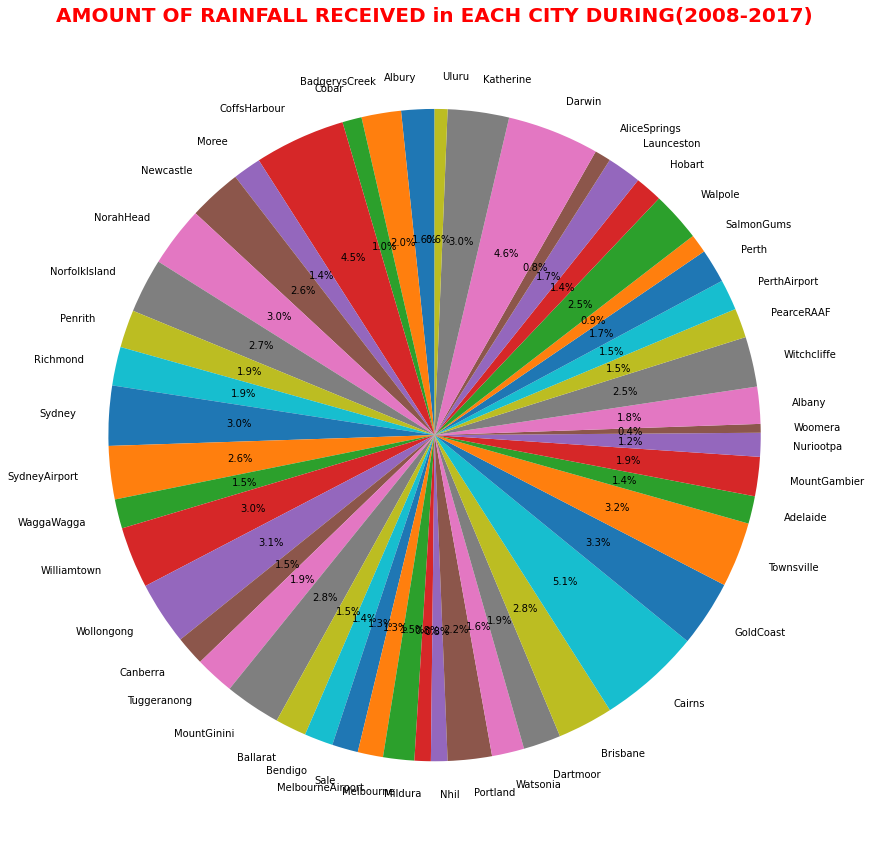

In [19]:
rainfall_mean = []
for city in Location:
    rain_per_city = []
    for i in range(10):
        city_name = date[i][date[i].Location == city]
        try:
            rain_per_city.append(stat.mean(city_name.Rainfall.values))
        except:
            pass
    rainfall_mean.append(stat.mean(rain_per_city))
plt.figure(figsize=(15, 15))
plt.pie(rainfall_mean, labels=Location, autopct='%1.1f%%',startangle=90)
plt.title("AMOUNT OF RAINFALL RECEIVED in EACH CITY DURING(2008-2017)", color='red', fontsize=20, fontweight='bold')    
plt.show()


# AMOUNT OF RAINFALL RECEIVED by EACH CITY per YEAR

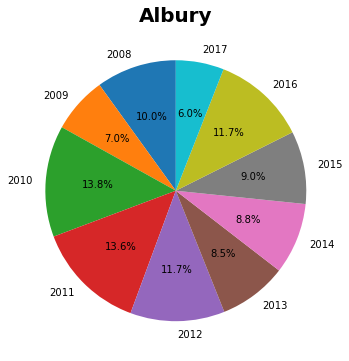

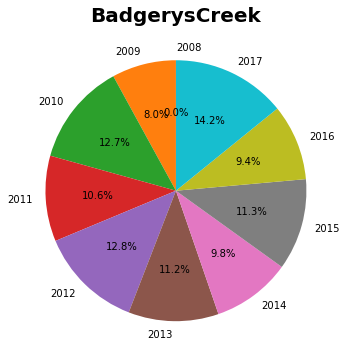

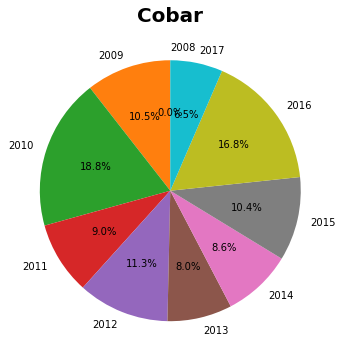

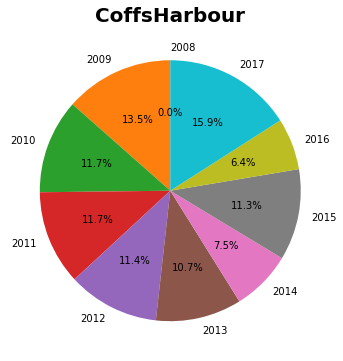

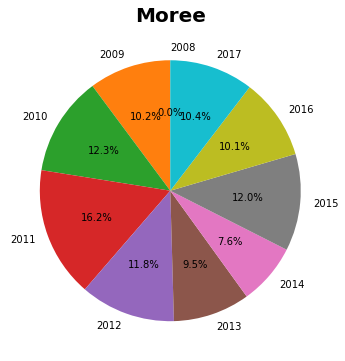

...

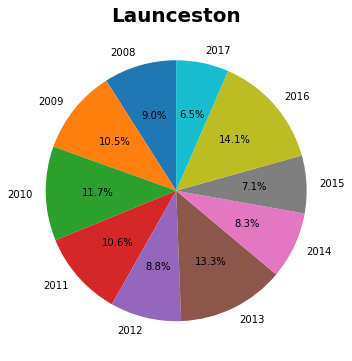

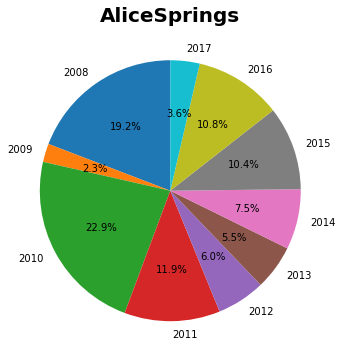

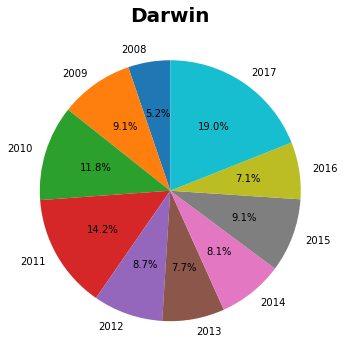

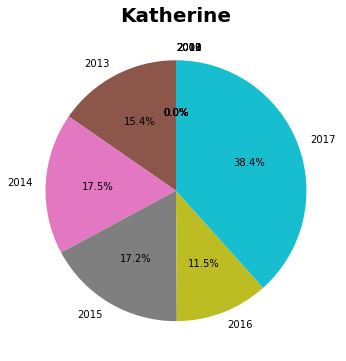

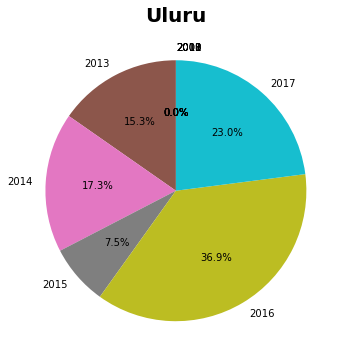

In [20]:
year = ['2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']
total_rain = []
for city in Location:
    avg = []
    for i in range(10):
        city_name = date[i][date[i].Location == city]
        try:
            avg.append(stat.mean(city_name.Rainfall.values))
        except:
            avg.append(0)
    total_rain.append(stat.mean(avg))
    plt.figure(figsize=(6, 6))
    plt.pie(avg, labels=year, autopct='%1.1f%%',startangle=90)
    plt.title(city, fontsize=20, fontweight='bold')    
    plt.show()


# Direction of wind during Rainy Days

<ipython-input-83-dddd0a064e2b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


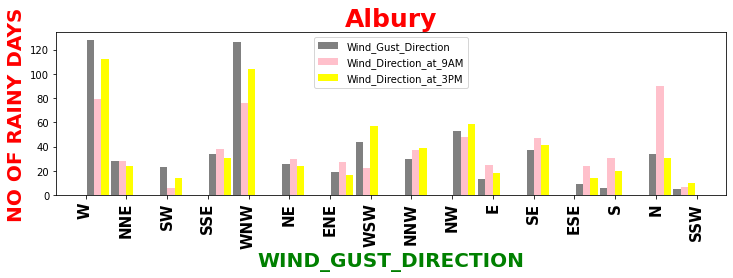

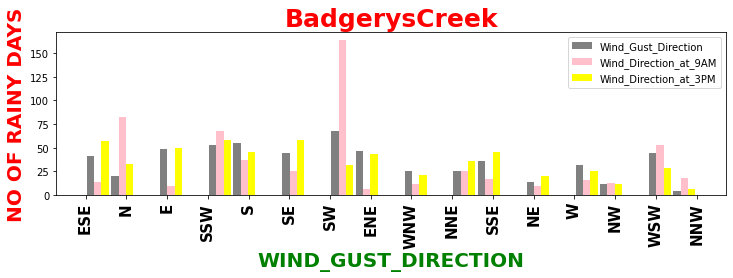

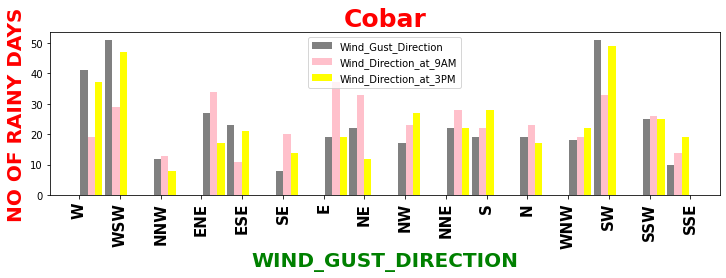

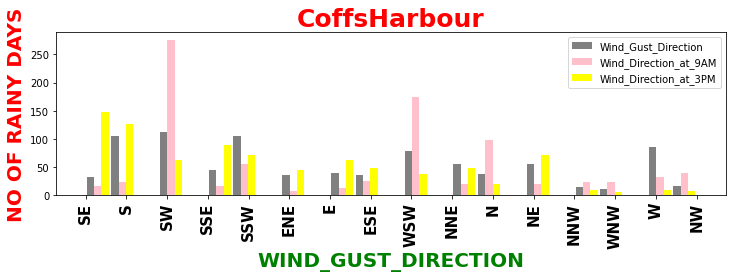

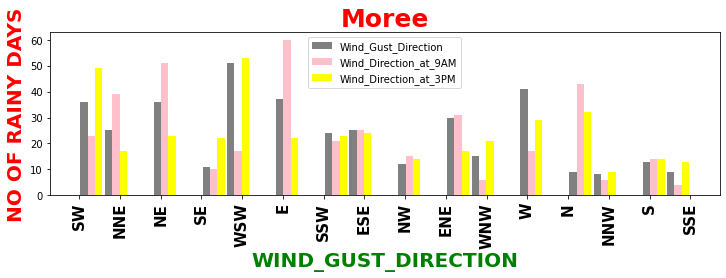

...

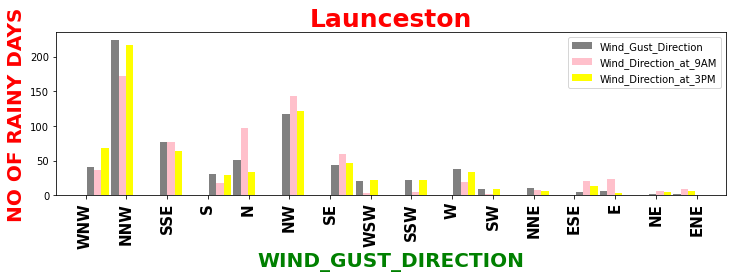

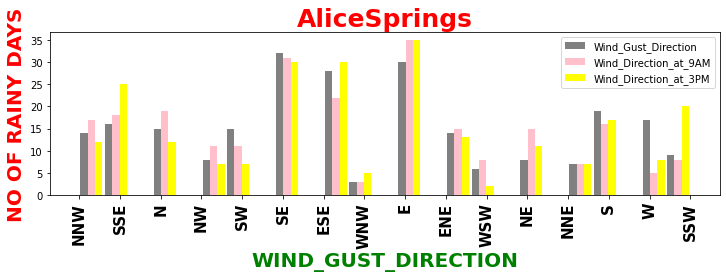

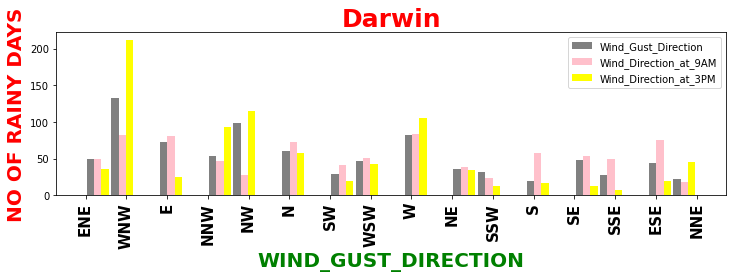

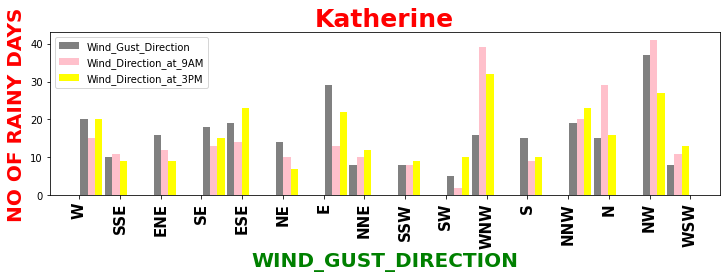

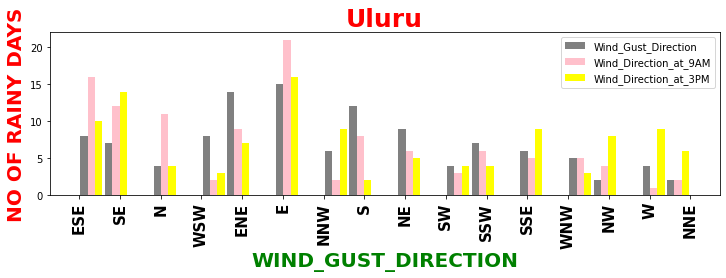

In [83]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        wind_direction = wind_in_city.WindGustDir[wind_in_city.RainToday == 'Yes']
        wind_at_9am = wind_in_city.WindDir9am[wind_in_city.RainToday == 'Yes']
        wind_at_3pm = wind_in_city.WindDir3pm[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('WIND_GUST_DIRECTION', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([wind_direction, wind_at_9am, wind_at_3pm] ,bins=25, label=['Wind_Gust_Direction', 'Wind_Direction_at_9AM', 'Wind_Direction_at_3PM'], rwidth=0.9, color=['grey','pink', 'yellow'])
        plt.legend()

    


In [59]:
data[data.Location == 'Albany']

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
105968,2008-12-01,Albany,13.3000,13.3000,0.000000,3.800000,8.900000,W,39.984292,NNW,...,63.000000,1017.9,1015.2,7.000000,5.000000,15.200000,17.900000,No,0.0,No
105969,2008-12-02,Albany,14.7000,14.7000,0.000000,5.400000,9.100000,W,39.984292,NE,...,71.000000,1012.8,1009.3,2.000000,6.000000,17.800000,19.100000,No,0.2,No
105970,2008-12-03,Albany,16.5000,16.5000,0.200000,4.800000,10.000000,W,39.984292,ENE,...,73.000000,999.8,998.7,7.000000,7.000000,20.000000,21.000000,No,7.8,Yes
105971,2008-12-04,Albany,14.1000,14.1000,7.800000,7.000000,7.200000,W,39.984292,N,...,81.000000,1006.7,1008.5,5.000000,7.000000,19.800000,18.000000,Yes,0.0,No
105972,2008-12-05,Albany,13.0000,13.0000,0.000000,3.600000,4.900000,W,39.984292,SW,...,63.000000,1015.3,1016.3,3.000000,5.000000,16.000000,17.000000,No,0.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108979,2017-06-21,Albany,12.1864,12.1864,2.349974,5.469824,7.624853,W,39.984292,N,...,51.482606,1016.6,1012.3,4.437189,4.503167,16.987509,21.687235,No,20.2,Yes
108980,2017-06-22,Albany,12.1864,12.1864,20.200000,5.469824,7.624853,W,39.984292,SE,...,51.482606,1014.9,1015.8,7.000000,4.503167,14.200000,21.687235,Yes,6.2,Yes
108981,2017-06-23,Albany,12.1864,12.1864,6.200000,5.469824,7.624853,W,39.984292,SE,...,51.482606,1025.5,1025.5,7.000000,4.503167,14.400000,21.687235,Yes,1.2,Yes
108982,2017-06-24,Albany,12.1864,12.1864,1.200000,5.469824,7.624853,W,39.984292,SE,...,51.482606,1028.4,1026.6,7.000000,4.503167,13.300000,21.687235,Yes,0.4,No


In [75]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow'],
      dtype='object')

# Speed of wind during Rainy Days

<ipython-input-82-fd2b795bb851>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


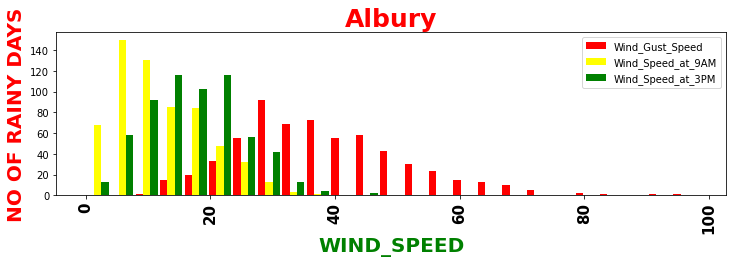

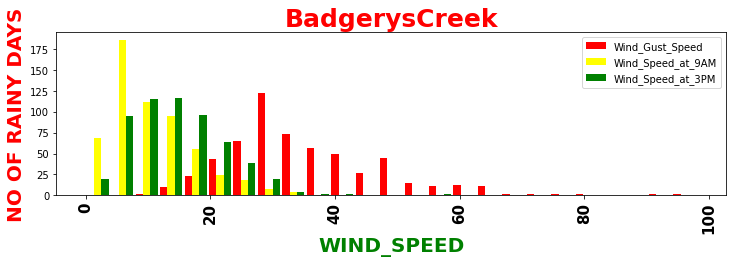

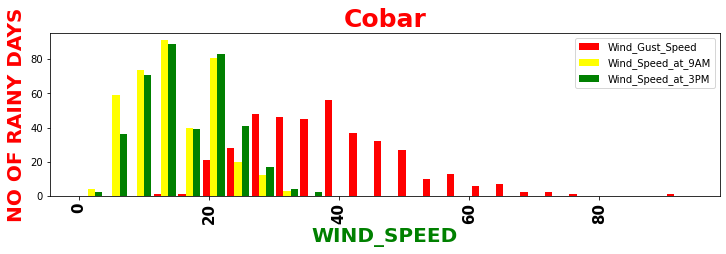

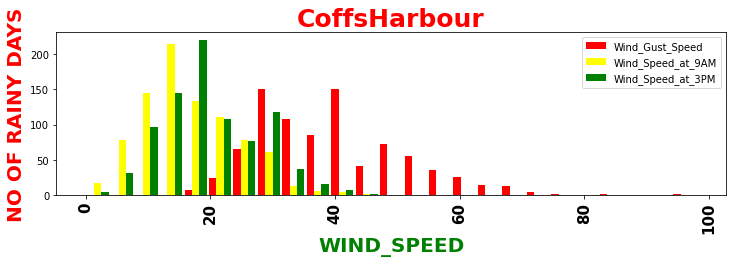

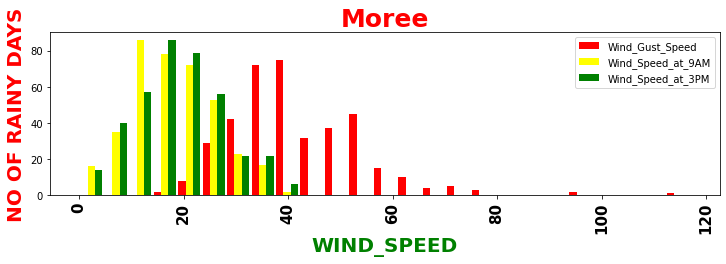

...

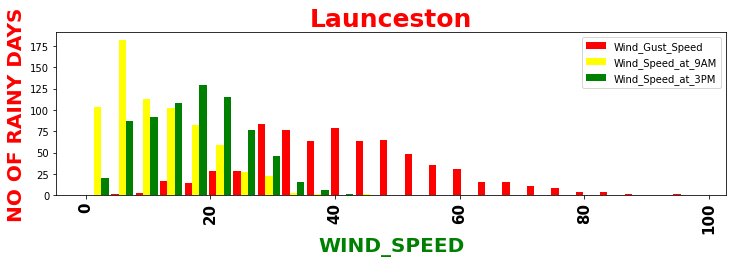

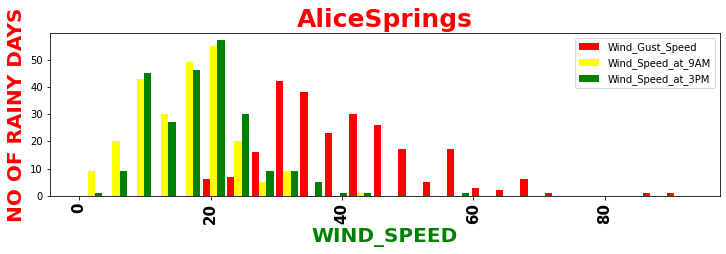

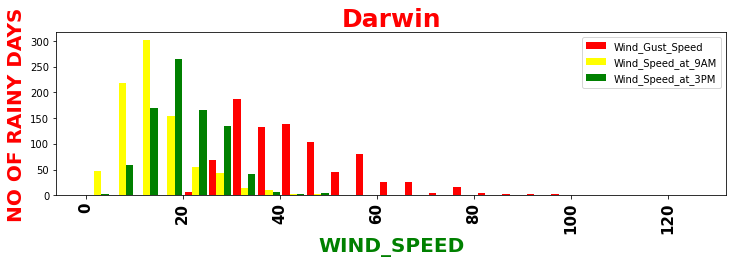

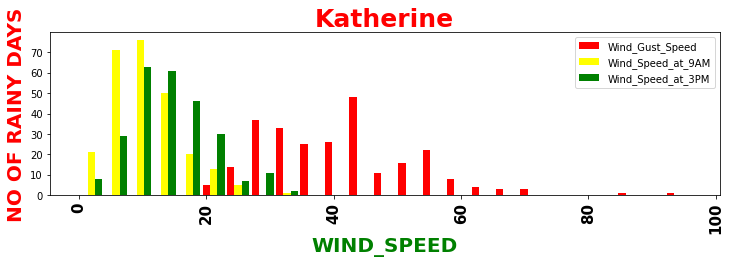

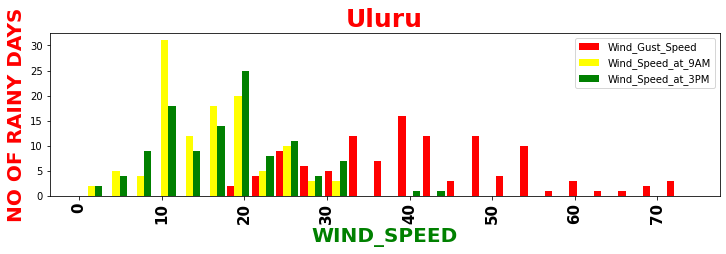

In [82]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        wind_speed = wind_in_city.WindGustSpeed[wind_in_city.RainToday == 'Yes']
        wind_speed_9am = wind_in_city.WindSpeed9am[wind_in_city.RainToday == 'Yes']
        wind_speed_3pm = wind_in_city.WindSpeed3pm[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('WIND_SPEED', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([wind_speed, wind_speed_9am, wind_speed_3pm] ,bins=25, label=['Wind_Gust_Speed', 'Wind_Speed_at_9AM', 'Wind_Speed_at_3PM'], rwidth=0.9, color=['red','yellow', 'green'])
        plt.legend()

    


# Cities Temperature during Rainy days

<ipython-input-89-176d1175d4c8>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


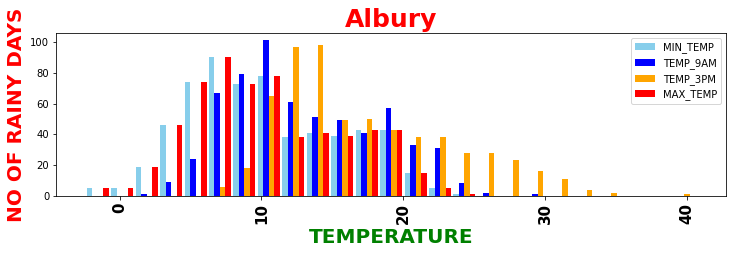

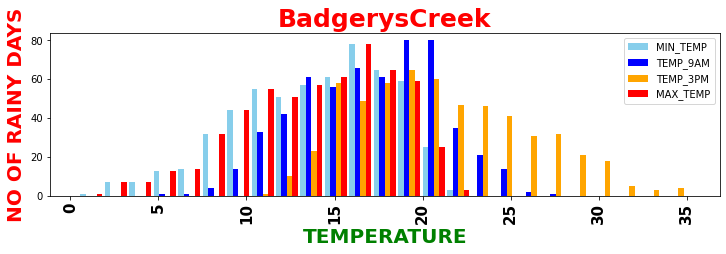

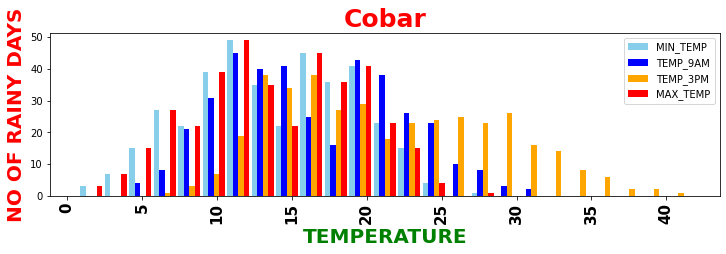

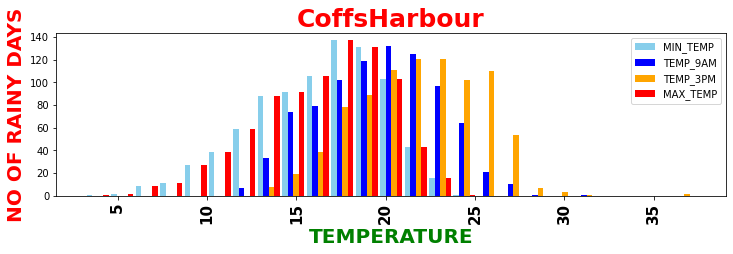

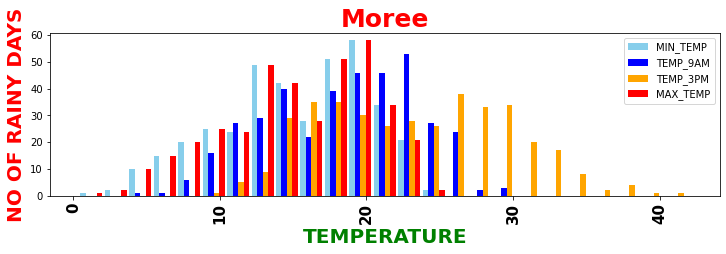

...

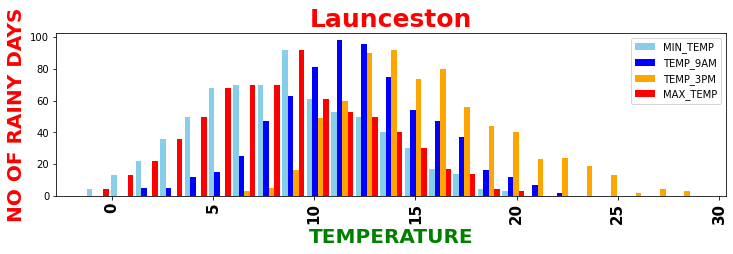

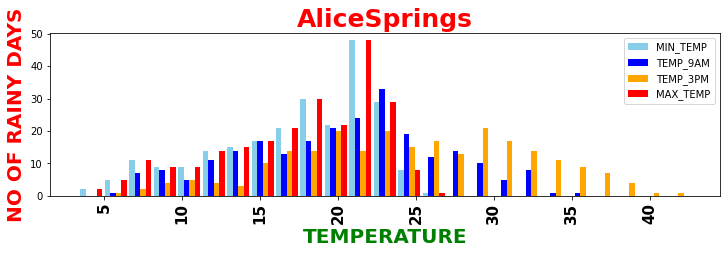

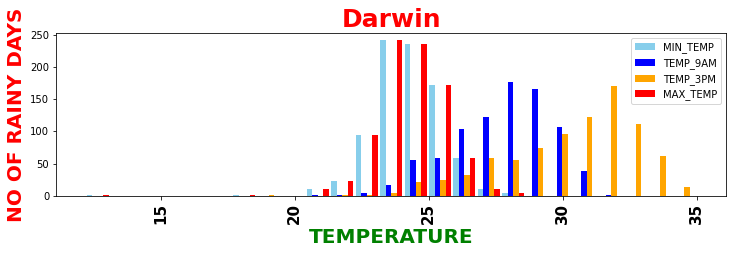

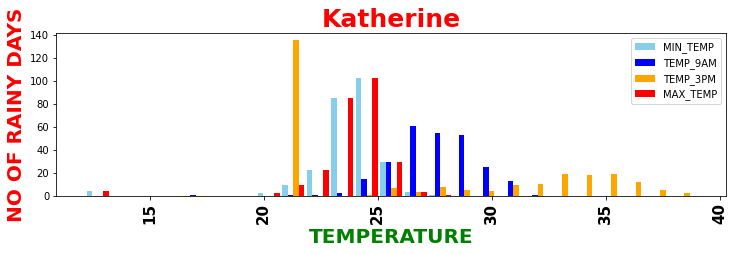

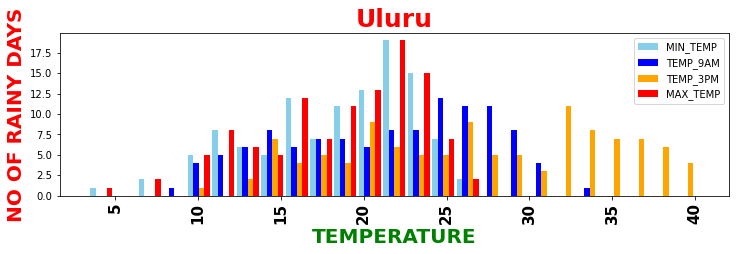

In [89]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        min_temp = wind_in_city.MinTemp[wind_in_city.RainToday == 'Yes']
        temp_9am = wind_in_city.Temp9am[wind_in_city.RainToday == 'Yes']
        temp_3pm = wind_in_city.Temp3pm[wind_in_city.RainToday == 'Yes']
        max_temp = wind_in_city.MaxTemp[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('TEMPERATURE', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([min_temp, temp_9am, temp_3pm, max_temp] ,bins=25, label=['MIN_TEMP', 'TEMP_9AM', 'TEMP_3PM', 'MAX_TEMP'], rwidth=0.9, color=['skyblue','blue', 'orange', 'red'])
        plt.legend()

# Cities Humidity range during Rainy days

<ipython-input-84-968626204bc3>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


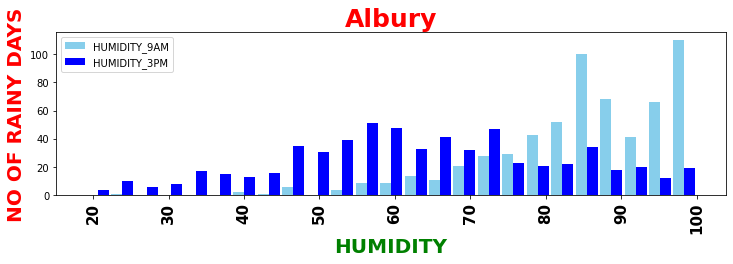

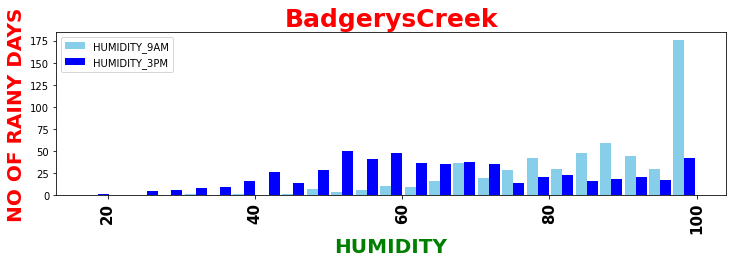

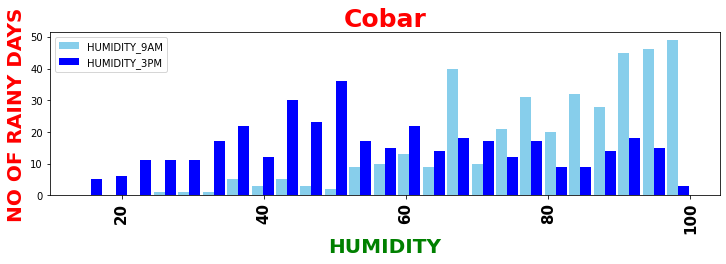

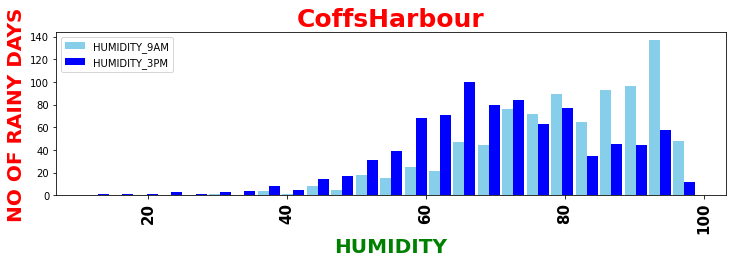

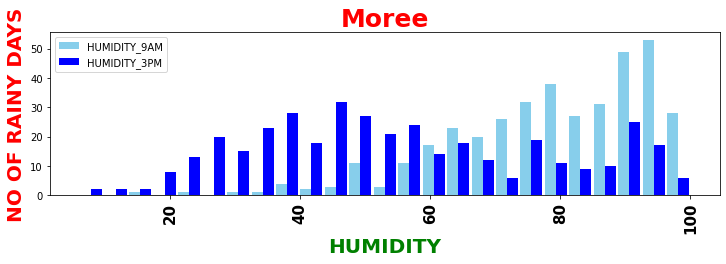

...

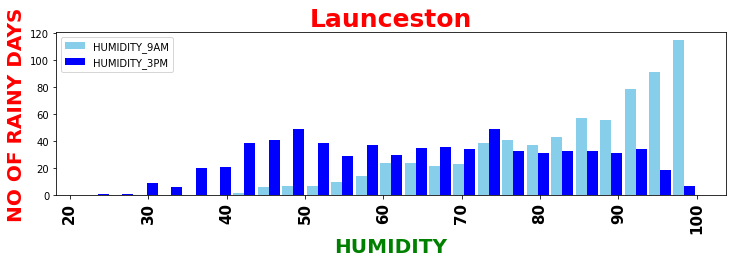

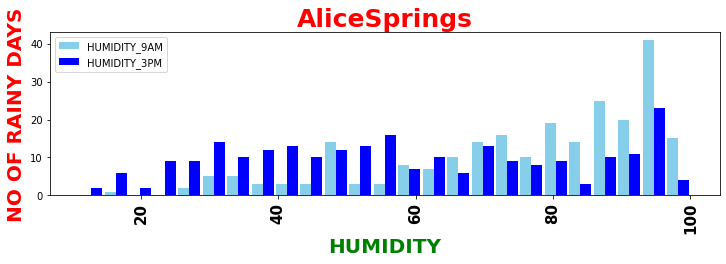

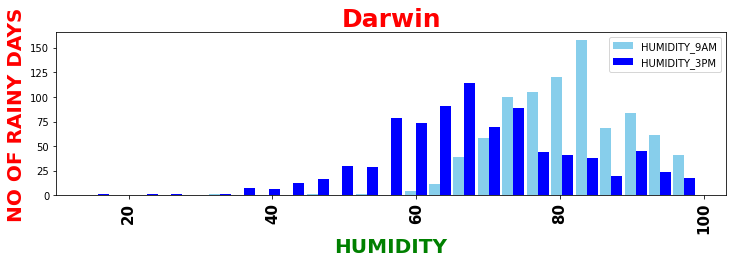

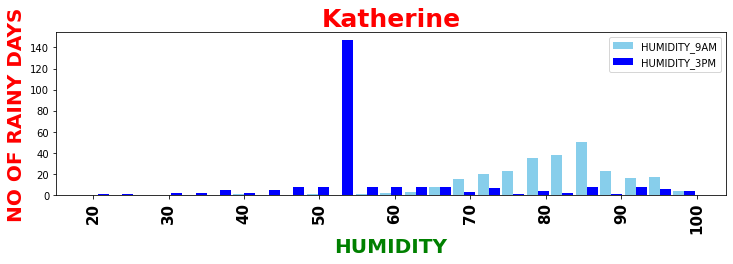

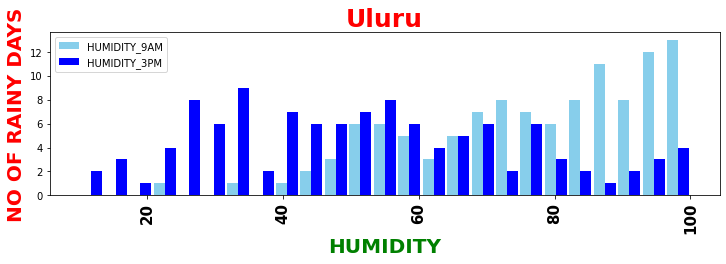

In [84]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        hum_9am = wind_in_city.Humidity9am[wind_in_city.RainToday == 'Yes']
        hum_3pm = wind_in_city.Humidity3pm[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('HUMIDITY', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([hum_9am, hum_3pm] ,bins=25, label=['HUMIDITY_9AM', 'HUMIDITY_3PM'], rwidth=0.9, color=['skyblue','blue'])
        plt.legend()

# Cities Pressure during Rainy days

<ipython-input-87-83aaec3bdeb3>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


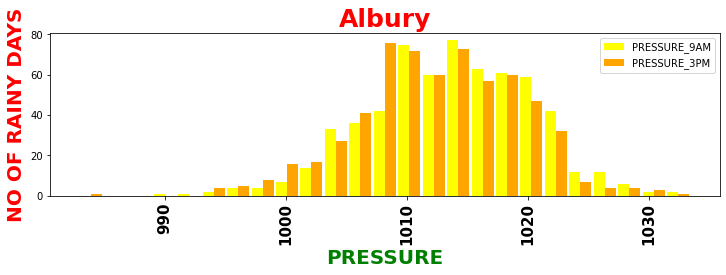

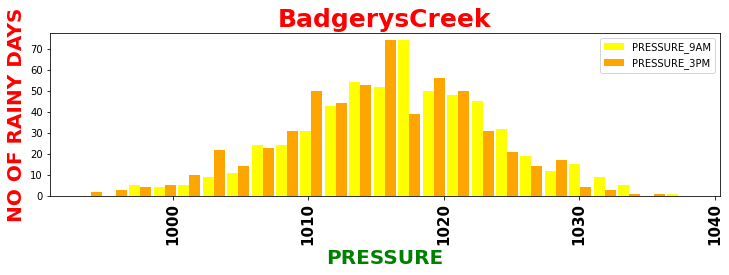

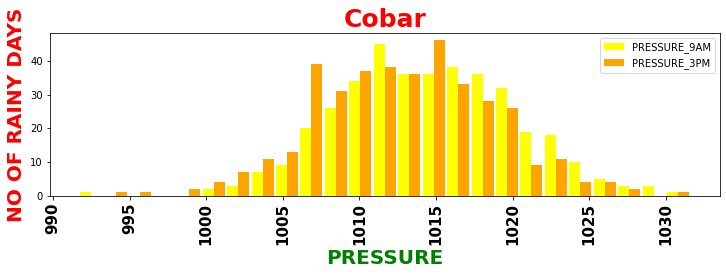

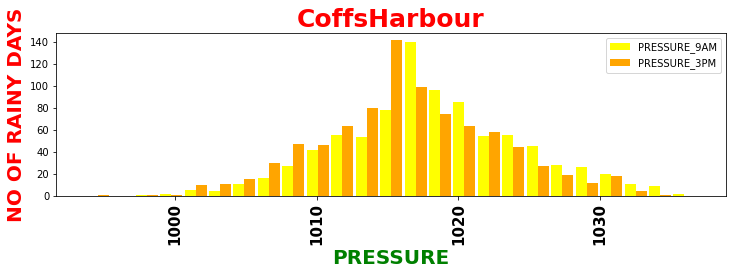

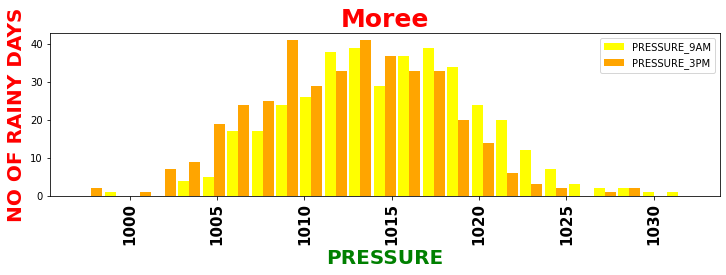

...

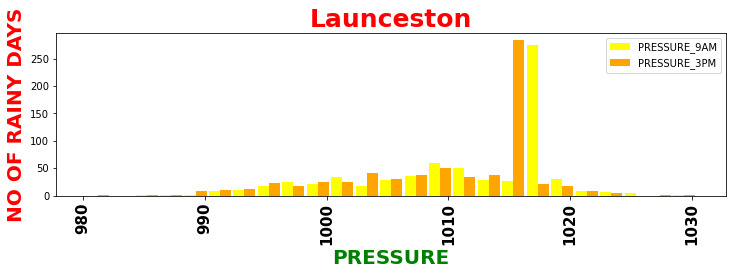

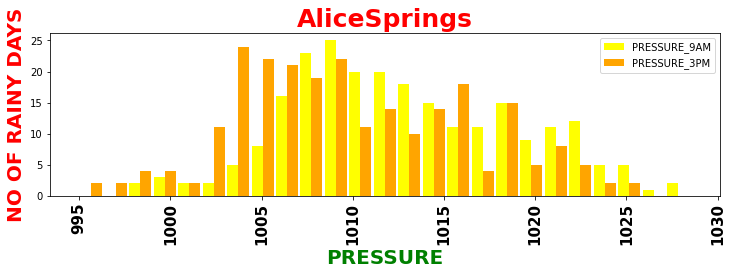

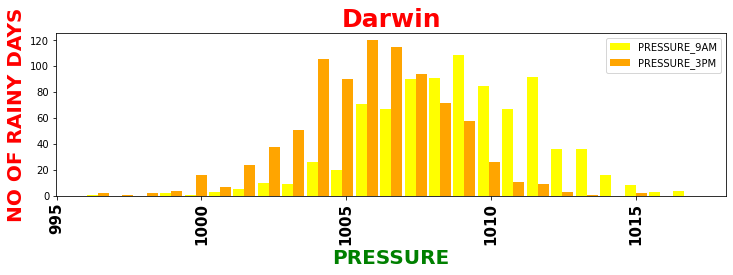

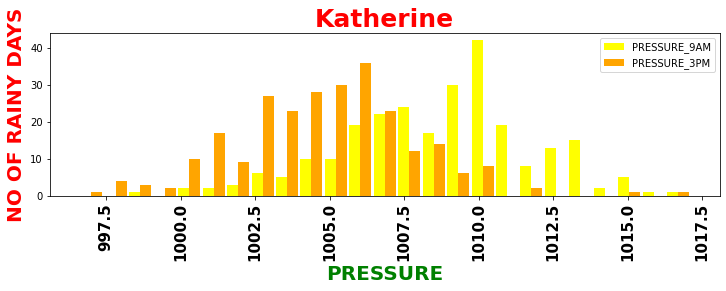

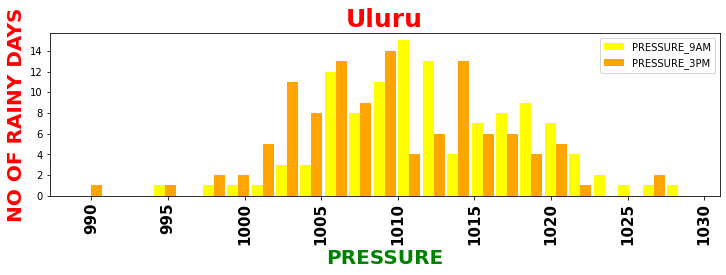

In [87]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        press_9am = wind_in_city.Pressure9am[wind_in_city.RainToday == 'Yes']
        press_3pm = wind_in_city.Pressure3pm[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('PRESSURE', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([press_9am, press_3pm] ,bins=25, label=['PRESSURE_9AM', 'PRESSURE_3PM'], rwidth=0.9, color=['yellow','orange'])
        plt.legend()

# Cloud in cities during Rainy days

<ipython-input-94-5e2a76ee425f>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12, 3))


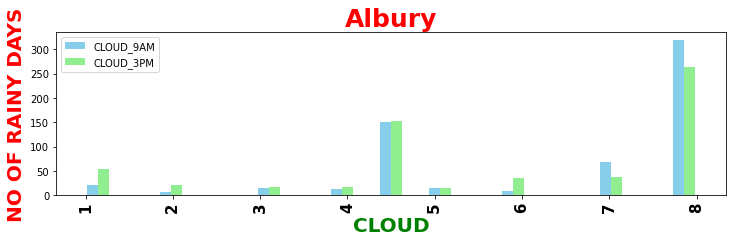

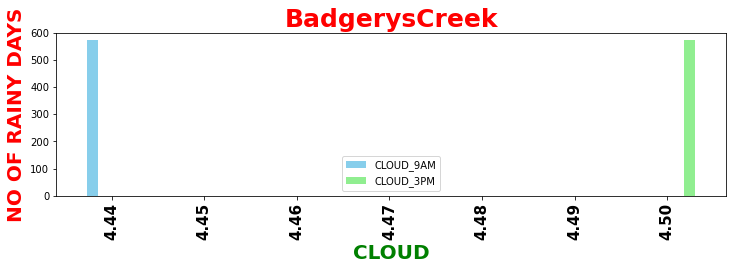

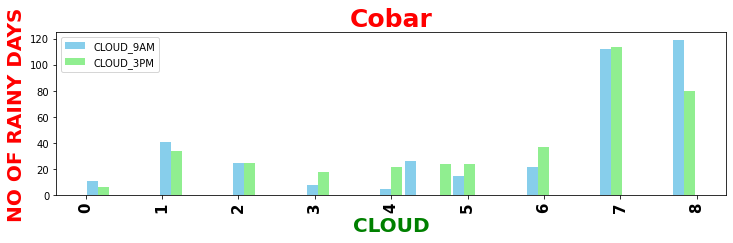

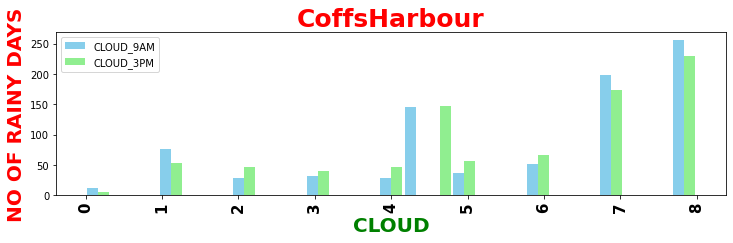

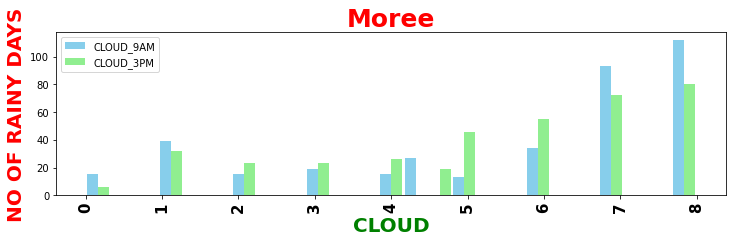

...

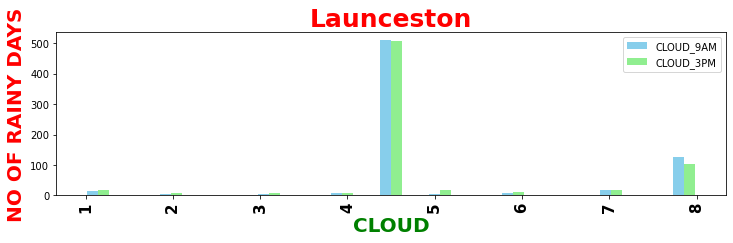

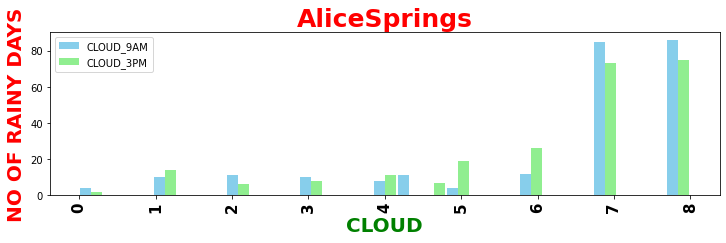

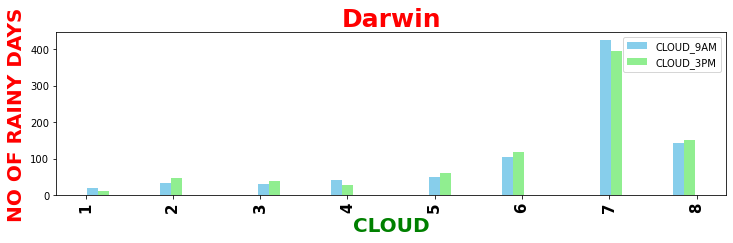

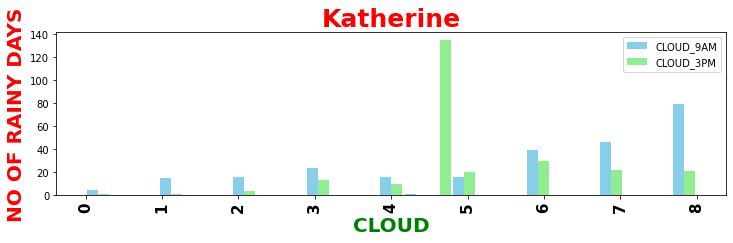

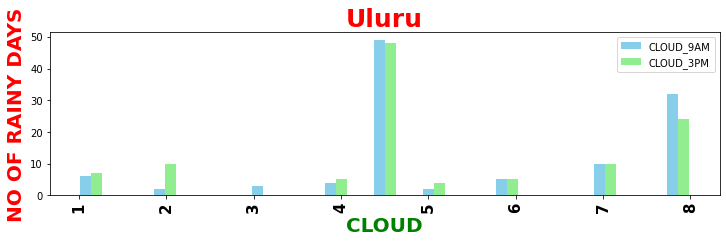

In [94]:
for loc in range(len(Location)):
        wind_in_city = data[data.Location == Location[loc]]
        cloud_9am = wind_in_city.Cloud9am[wind_in_city.RainToday == 'Yes']
        cloud_3pm = wind_in_city.Cloud3pm[wind_in_city.RainToday == 'Yes']
        plt.figure(figsize=(12, 3))
        plt.title(Location[loc],color='red', fontsize=25,fontweight="bold")
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('CLOUD', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('NO OF RAINY DAYS',color='red',fontsize=20, fontweight="bold")
        plt.hist([cloud_9am, cloud_3pm] ,bins=25, label=['CLOUD_9AM', 'CLOUD_3PM'], rwidth=0.9, color=['skyblue','lightgreen'])
        plt.legend()

# Risk_MM compare with Gust_Speed

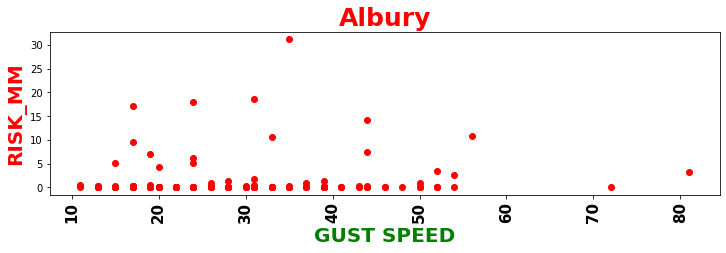

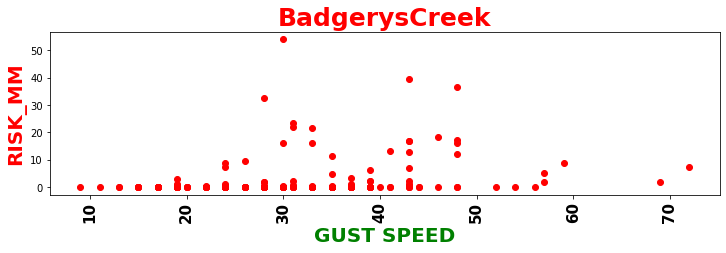

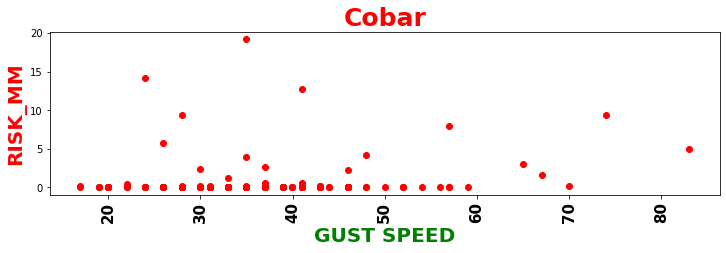

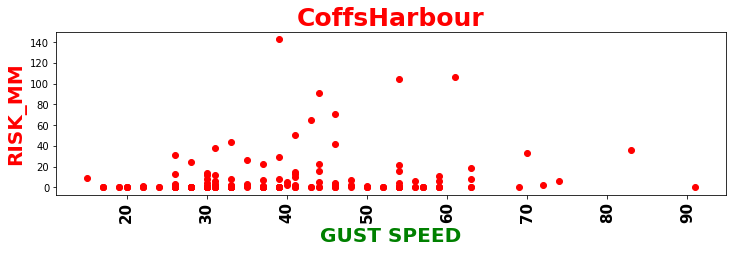

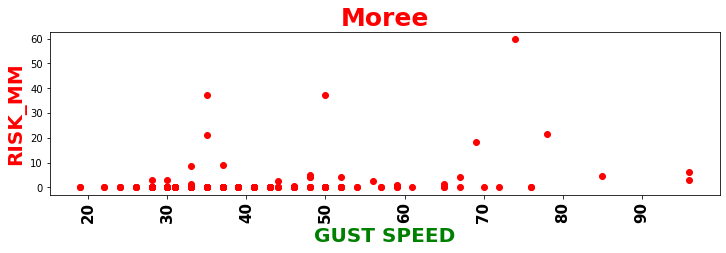

...

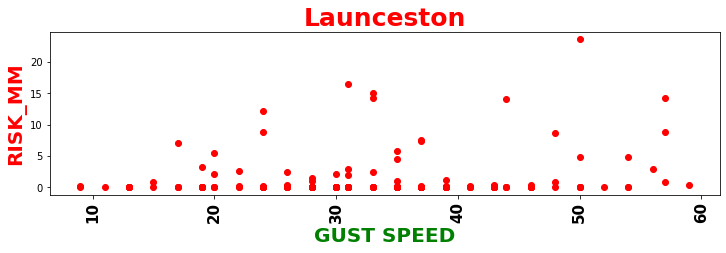

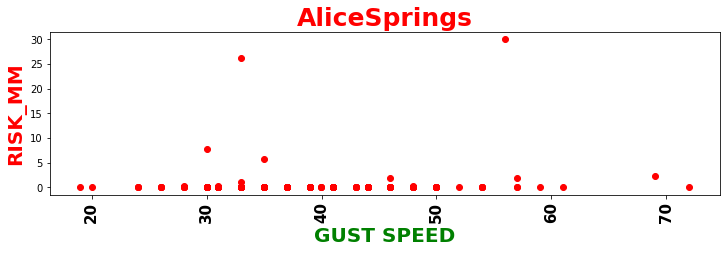

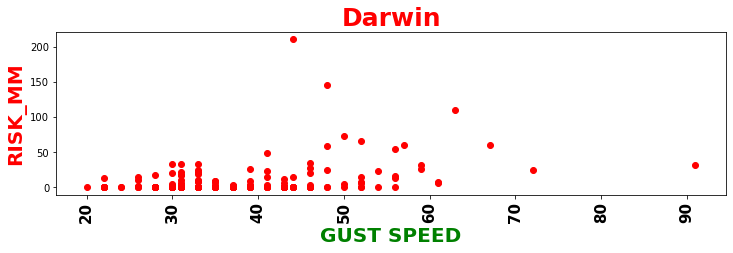

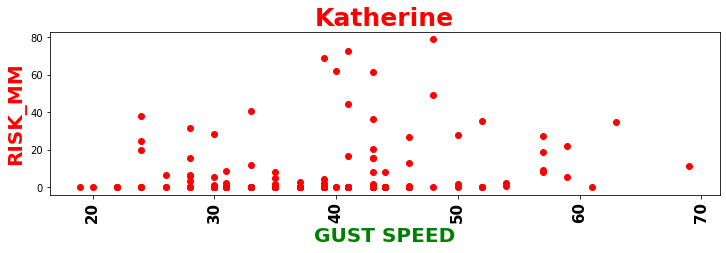

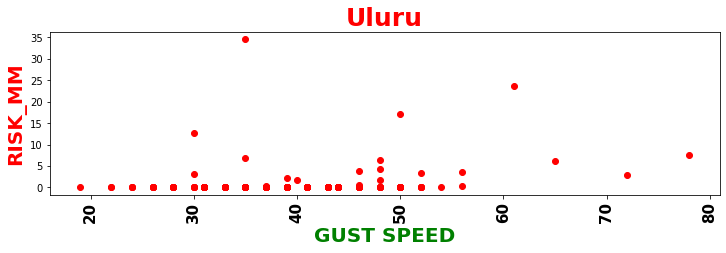

In [144]:
year = ['2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']
color = ['violet', 'grey', 'blue', 'red', 'black', 'green', 'orange', 'skyblue', 'lightgreen', 'pink']
for i in range(49):
    try:
        plt.figure(figsize=(12, 3))
        city_risk = date[9][date[9].Location == Location[i]]
        plt.title(Location[i],color='red', fontsize=25,fontweight="bold")
        plt.plot(city_risk.WindGustSpeed, city_risk.RISK_MM, 'ro', linewidth=3)  
        plt.xticks(rotation = 90,fontsize=15, fontweight="bold")
        plt.xlabel('GUST SPEED', color='green',fontsize=20, fontweight="bold")
        plt.ylabel('RISK_MM',color='red',fontsize=20, fontweight="bold")  
        plt.show()
    except:
        pass
    

In [134]:
        city_risk = date[9][date[9].Location == Locatio[i]]


NameError: name 'Locatio' is not defined

In [126]:
date[1].RISK_MM.shape

(16595,)

In [128]:
date[1].WindGustDir.shape

(16595,)

In [ ]:
    try:
        plt.plot(data.WindGustSpeed, data.RISK_MM, color=color[i], linewidth=3)  
    except:
        pass
    plt.figure(figsize=(15, 5))
    plt.xticks(rotation = 90,fontsize=15, fontweight="bold", label=str(i+2008))
    plt.xlabel('GUST SPEED', color='green',fontsize=20, fontweight="bold")
    plt.ylabel('RISK_MM',color='red',fontsize=20, fontweight="bold")  
    plt.legend()
    plt.show()